# Task 2: VAEs vs GANs

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## Data Pipeline

In [ ]:

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])


batch_size = 128

trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size,
                                          shuffle=True, num_workers=2)
testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=batch_size,
                                         shuffle=False, num_workers=2)



100%|██████████| 170M/170M [00:03<00:00, 46.7MB/s]


## VAE Training

In [ ]:
class VAE(nn.Module):
    def __init__(self, latent_dim=128):
        super(VAE, self).__init__()

        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, 4, 2, 1), nn.ReLU(True),
            nn.Conv2d(32, 64, 4, 2, 1), nn.ReLU(True),
            nn.Conv2d(64, 128, 4, 2, 1), nn.ReLU(True)
        )

        self.fc_mu = nn.Linear(128*4*4, latent_dim)
        self.fc_var = nn.Linear(128*4*4, latent_dim)

        self.fc = nn.Linear(latent_dim, 128*4*4)
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, 4, 2, 1), nn.ReLU(True),
            nn.ConvTranspose2d(64, 32, 4, 2, 1), nn.ReLU(True),
            nn.ConvTranspose2d(32, 3, 4, 2, 1), nn.Tanh()
        )

    def encode(self, x):
        h = self.encoder(x).view(x.size(0), -1)
        mu, log_var = self.fc_mu(h), self.fc_var(h)
        return mu, log_var

    def reparameterize(self, mu, log_var):
        std = torch.exp(0.5 * log_var)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        h = self.fc(z).view(z.size(0), 128, 4, 4)
        return self.decoder(h)

    def forward(self, x):
        mu, log_var = self.encode(x)
        z = self.reparameterize(mu, log_var)
        return self.decode(z), mu, log_var

### Training

[Beta-VAE] Epoch 1, Total: 238.3743, Recon: 231.8613, KL: 260.5221 (β=0.025)
[Beta-VAE] Epoch 2, Total: 120.3230, Recon: 106.8096, KL: 270.2661 (β=0.050)
[Beta-VAE] Epoch 3, Total: 106.5199, Recon: 87.6554, KL: 251.5258 (β=0.075)
[Beta-VAE] Epoch 4, Total: 103.5796, Recon: 80.1954, KL: 233.8417 (β=0.100)
[Beta-VAE] Epoch 5, Total: 103.8143, Recon: 76.6182, KL: 217.5693 (β=0.125)
[Beta-VAE] Epoch 6, Total: 105.4445, Recon: 74.9861, KL: 203.0560 (β=0.150)
[Beta-VAE] Epoch 7, Total: 107.7646, Recon: 74.3915, KL: 190.7031 (β=0.175)
[Beta-VAE] Epoch 8, Total: 110.5864, Recon: 74.6896, KL: 179.4839 (β=0.200)
[Beta-VAE] Epoch 9, Total: 113.4916, Recon: 75.3897, KL: 169.3419 (β=0.225)
[Beta-VAE] Epoch 10, Total: 116.4118, Recon: 76.2931, KL: 160.4748 (β=0.250)
[Beta-VAE] Epoch 11, Total: 119.4425, Recon: 77.4598, KL: 152.6641 (β=0.275)
[Beta-VAE] Epoch 12, Total: 122.1353, Recon: 78.3617, KL: 145.9121 (β=0.300)
[Beta-VAE] Epoch 13, Total: 125.0673, Recon: 79.6933, KL: 139.6126 (β=0.325)
[Beta-

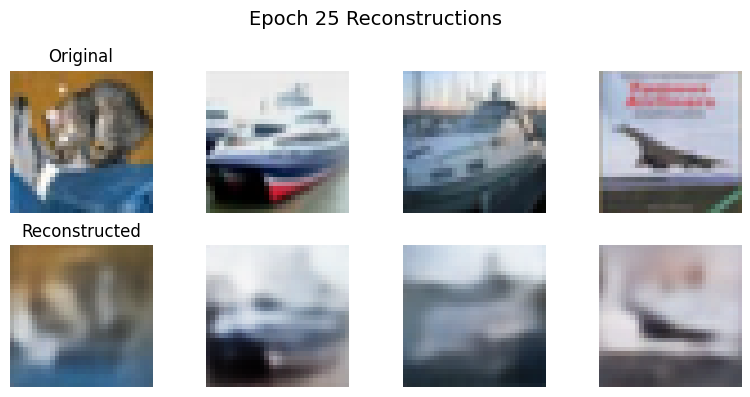

[Beta-VAE] Epoch 26, Total: 156.4934, Recon: 96.5303, KL: 92.2510 (β=0.650)
[Beta-VAE] Epoch 27, Total: 158.5470, Recon: 97.8245, KL: 89.9593 (β=0.675)
[Beta-VAE] Epoch 28, Total: 160.6776, Recon: 99.1501, KL: 87.8965 (β=0.700)
[Beta-VAE] Epoch 29, Total: 162.6203, Recon: 100.3410, KL: 85.9025 (β=0.725)
[Beta-VAE] Epoch 30, Total: 164.6407, Recon: 101.6387, KL: 84.0027 (β=0.750)
[Beta-VAE] Epoch 31, Total: 166.4959, Recon: 102.8228, KL: 82.1588 (β=0.775)
[Beta-VAE] Epoch 32, Total: 168.4702, Recon: 104.1996, KL: 80.3382 (β=0.800)
[Beta-VAE] Epoch 33, Total: 170.2122, Recon: 105.3392, KL: 78.6340 (β=0.825)
[Beta-VAE] Epoch 34, Total: 172.1072, Recon: 106.6425, KL: 77.0173 (β=0.850)
[Beta-VAE] Epoch 35, Total: 173.8084, Recon: 107.7182, KL: 75.5316 (β=0.875)
[Beta-VAE] Epoch 36, Total: 175.5517, Recon: 108.9897, KL: 73.9579 (β=0.900)
[Beta-VAE] Epoch 37, Total: 177.3251, Recon: 110.2307, KL: 72.5345 (β=0.925)
[Beta-VAE] Epoch 38, Total: 178.9283, Recon: 111.2661, KL: 71.2234 (β=0.950)
[B

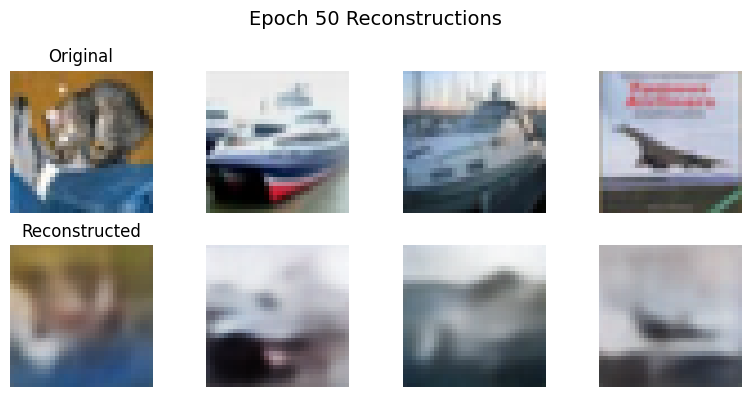

In [ ]:
import torch
import torch.nn.functional as F
import torch.optim as optim

def denormalize(img_tensor):
    return (img_tensor * 0.5 + 0.5).clamp(0,1)

def beta_vae_loss(recon_x, x, mu, logvar, beta=5.0):
    recon_loss = F.mse_loss(recon_x, x, reduction='sum')
    kl_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    total_loss = recon_loss + beta * kl_loss
    return total_loss, recon_loss, kl_loss

fixed_batch, _ = next(iter(testloader))
fixed_batch = fixed_batch.to(device)

vae = VAE(latent_dim=128).to(device)
optimizer = optim.Adam(vae.parameters(), lr=1e-3)


num_epochs = 50
beta_max = 1.0
anneal_epochs = 40  

for epoch in range(num_epochs):
    vae.train()
    total_loss_epoch, recon_loss_epoch, kl_loss_epoch = 0, 0, 0

    
    beta = beta_max * min(1.0, (epoch + 1) / anneal_epochs)

    for imgs, _ in trainloader:
        imgs = imgs.to(device)

        recon, mu, logvar = vae(imgs)
        loss, recon_loss, kl_loss = beta_vae_loss(recon, imgs, mu, logvar, beta=beta)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss_epoch += loss.item()
        recon_loss_epoch += recon_loss.item()
        kl_loss_epoch += kl_loss.item()

    num_samples = len(trainloader.dataset)
    print(f"[Beta-VAE] Epoch {epoch+1}, "
          f"Total: {total_loss_epoch/num_samples:.4f}, "
          f"Recon: {recon_loss_epoch/num_samples:.4f}, "
          f"KL: {kl_loss_epoch/num_samples:.4f} (β={beta:.3f})")

    
    if (epoch + 1) % 25 == 0:
        checkpoint_path = f"./betaVAE_epoch{epoch+1}.pth"
        torch.save(vae.state_dict(), checkpoint_path)
        print(f"Saved checkpoint for epoch {epoch}.")

        vae.eval()
        with torch.no_grad():
            recon, _, _ = vae(fixed_batch)

        n = 4  
        fig, axes = plt.subplots(2, n, figsize=(2*n, 4))

        for i in range(n):
            
            axes[0, i].imshow(denormalize(fixed_batch[i]).permute(1, 2, 0).cpu().numpy())
            axes[0, i].axis("off")
            if i == 0:
                axes[0, i].set_title("Original")

            
            axes[1, i].imshow(denormalize(recon[i]).permute(1, 2, 0).cpu().numpy())
            axes[1, i].axis("off")
            if i == 0:
                axes[1, i].set_title("Reconstructed")

        plt.suptitle(f"Epoch {epoch+1} Reconstructions", fontsize=14)
        plt.tight_layout()
        plt.show()



In [ ]:
torch.save(vae.state_dict(), "./betaVAE_annealing40.pth")

In [ ]:
vae = VAE(latent_dim=128).to(device)
state_dict = torch.load("./betaVAE_annealing40.pth")
vae.load_state_dict(state_dict)

<All keys matched successfully>

## GAN Training

In [ ]:
class Generator(nn.Module):
    def __init__(self, latent_dim=100):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, 256, 4, 1, 0), nn.BatchNorm2d(256), nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1), nn.BatchNorm2d(128), nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1), nn.BatchNorm2d(64), nn.ReLU(True),
            nn.ConvTranspose2d(64, 3, 4, 2, 1), nn.Tanh()
        )
    def forward(self, z): return self.net(z)


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, 4, 2, 1), nn.BatchNorm2d(128), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, 4, 2, 1), nn.BatchNorm2d(256), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 1, 4, 1, 0), nn.Sigmoid()
        )
    def forward(self, x): return self.net(x).view(-1, 1)


[GAN] Epoch 1/50 | Avg D_loss: 0.6363, Avg G_loss: 4.2161 | D(x): 0.6498 | D(G(z)): 0.0759 / 0.0492
[GAN] Epoch 2/50 | Avg D_loss: 0.7235, Avg G_loss: 3.4378 | D(x): 0.6583 | D(G(z)): 0.1502 / 0.0813
[GAN] Epoch 3/50 | Avg D_loss: 0.9256, Avg G_loss: 2.4569 | D(x): 0.3896 | D(G(z)): 0.0723 / 0.1470
[GAN] Epoch 4/50 | Avg D_loss: 0.7912, Avg G_loss: 2.7397 | D(x): 0.5812 | D(G(z)): 0.0440 / 0.0439
[GAN] Epoch 5/50 | Avg D_loss: 0.7970, Avg G_loss: 2.4054 | D(x): 0.8004 | D(G(z)): 0.2654 / 0.0748


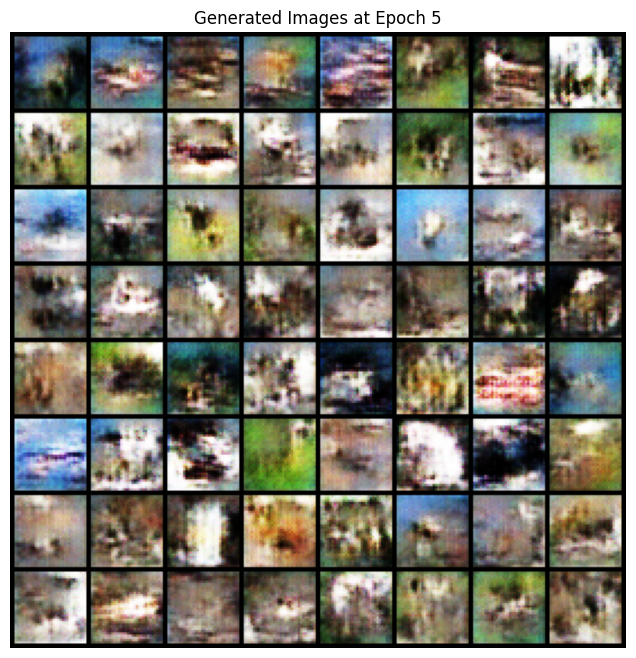

[GAN] Epoch 6/50 | Avg D_loss: 0.8630, Avg G_loss: 2.1540 | D(x): 0.4391 | D(G(z)): 0.1151 / 0.3217
[GAN] Epoch 7/50 | Avg D_loss: 0.9246, Avg G_loss: 2.0073 | D(x): 0.5984 | D(G(z)): 0.2305 / 0.2552
[GAN] Epoch 8/50 | Avg D_loss: 0.9085, Avg G_loss: 2.0730 | D(x): 0.7679 | D(G(z)): 0.2729 / 0.0763
[GAN] Epoch 9/50 | Avg D_loss: 0.9022, Avg G_loss: 2.0613 | D(x): 0.5310 | D(G(z)): 0.1685 / 0.2069
[GAN] Epoch 10/50 | Avg D_loss: 0.9048, Avg G_loss: 2.0810 | D(x): 0.5812 | D(G(z)): 0.1360 / 0.2150


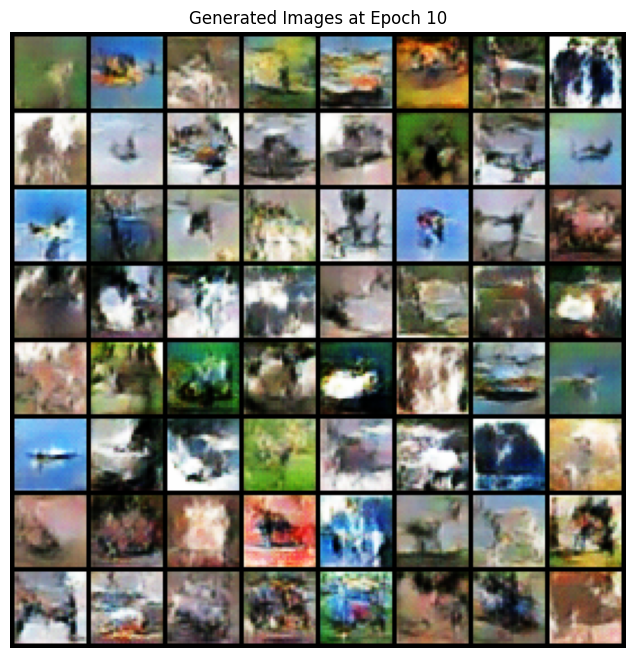

[GAN] Epoch 11/50 | Avg D_loss: 0.8801, Avg G_loss: 2.0711 | D(x): 0.5097 | D(G(z)): 0.1499 / 0.2308
[GAN] Epoch 12/50 | Avg D_loss: 0.8998, Avg G_loss: 2.0376 | D(x): 0.5543 | D(G(z)): 0.2584 / 0.1731
[GAN] Epoch 13/50 | Avg D_loss: 0.9314, Avg G_loss: 1.9704 | D(x): 0.6472 | D(G(z)): 0.1384 / 0.1094
[GAN] Epoch 14/50 | Avg D_loss: 0.9238, Avg G_loss: 1.9612 | D(x): 0.4957 | D(G(z)): 0.2495 / 0.3023
[GAN] Epoch 15/50 | Avg D_loss: 0.9256, Avg G_loss: 1.9352 | D(x): 0.7030 | D(G(z)): 0.4674 / 0.0897


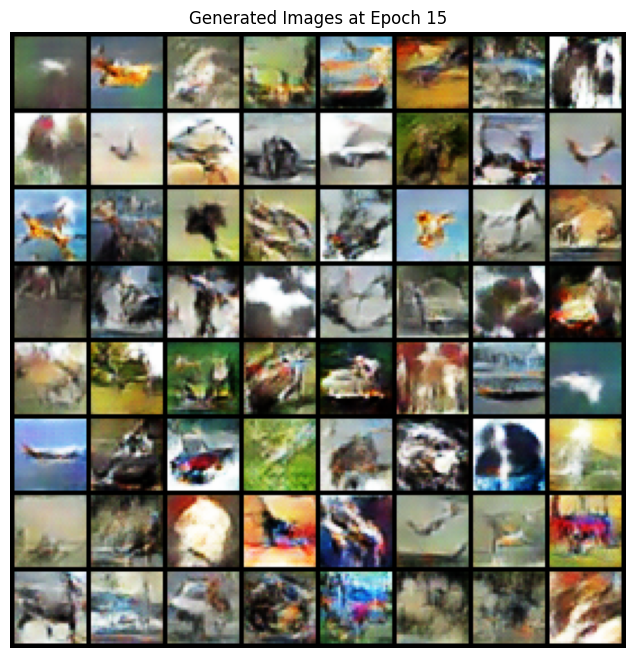

[GAN] Epoch 16/50 | Avg D_loss: 0.9391, Avg G_loss: 1.9471 | D(x): 0.8526 | D(G(z)): 0.5575 / 0.0300
[GAN] Epoch 17/50 | Avg D_loss: 0.9078, Avg G_loss: 1.9484 | D(x): 0.4262 | D(G(z)): 0.1769 / 0.3727
[GAN] Epoch 18/50 | Avg D_loss: 0.9080, Avg G_loss: 1.9681 | D(x): 0.8170 | D(G(z)): 0.3453 / 0.0909
[GAN] Epoch 19/50 | Avg D_loss: 0.8911, Avg G_loss: 1.9802 | D(x): 0.5804 | D(G(z)): 0.1132 / 0.1940
[GAN] Epoch 20/50 | Avg D_loss: 0.9250, Avg G_loss: 1.9705 | D(x): 0.7558 | D(G(z)): 0.2889 / 0.1030


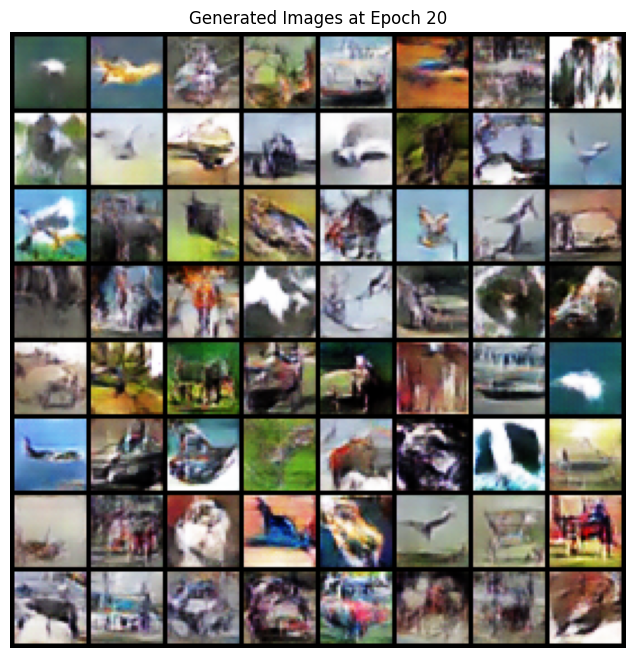

[GAN] Epoch 21/50 | Avg D_loss: 0.9197, Avg G_loss: 1.9751 | D(x): 0.8135 | D(G(z)): 0.4108 / 0.0532
[GAN] Epoch 22/50 | Avg D_loss: 0.8785, Avg G_loss: 1.9925 | D(x): 0.3371 | D(G(z)): 0.0758 / 0.3427
[GAN] Epoch 23/50 | Avg D_loss: 0.9101, Avg G_loss: 1.9986 | D(x): 0.5999 | D(G(z)): 0.2989 / 0.1981
[GAN] Epoch 24/50 | Avg D_loss: 0.9047, Avg G_loss: 2.0203 | D(x): 0.7935 | D(G(z)): 0.3459 / 0.0684
[GAN] Epoch 25/50 | Avg D_loss: 0.8999, Avg G_loss: 1.9786 | D(x): 0.4788 | D(G(z)): 0.1430 / 0.2931


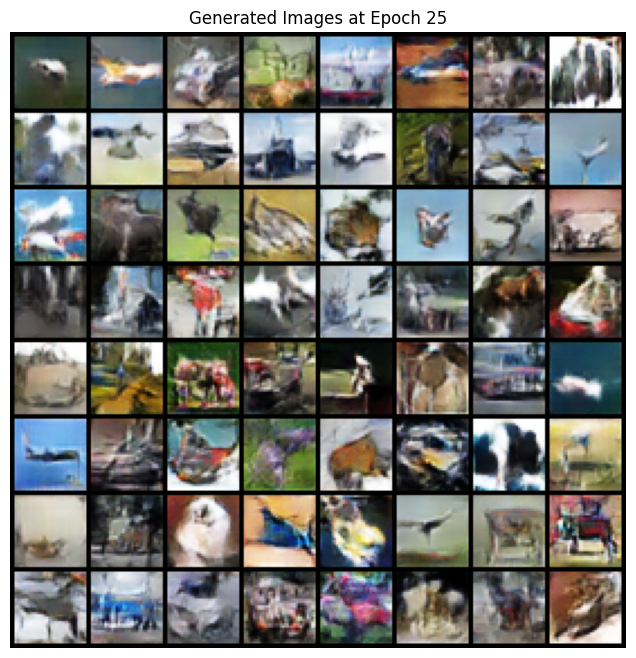

[GAN] Epoch 26/50 | Avg D_loss: 0.8572, Avg G_loss: 2.0194 | D(x): 0.7404 | D(G(z)): 0.1705 / 0.1283
[GAN] Epoch 27/50 | Avg D_loss: 0.8807, Avg G_loss: 2.0255 | D(x): 0.7473 | D(G(z)): 0.2998 / 0.1219
[GAN] Epoch 28/50 | Avg D_loss: 0.8702, Avg G_loss: 2.0400 | D(x): 0.8137 | D(G(z)): 0.3591 / 0.0753
[GAN] Epoch 29/50 | Avg D_loss: 0.8977, Avg G_loss: 2.0848 | D(x): 0.6569 | D(G(z)): 0.2159 / 0.1656
[GAN] Epoch 30/50 | Avg D_loss: 0.8553, Avg G_loss: 2.0344 | D(x): 0.7637 | D(G(z)): 0.3066 / 0.1170


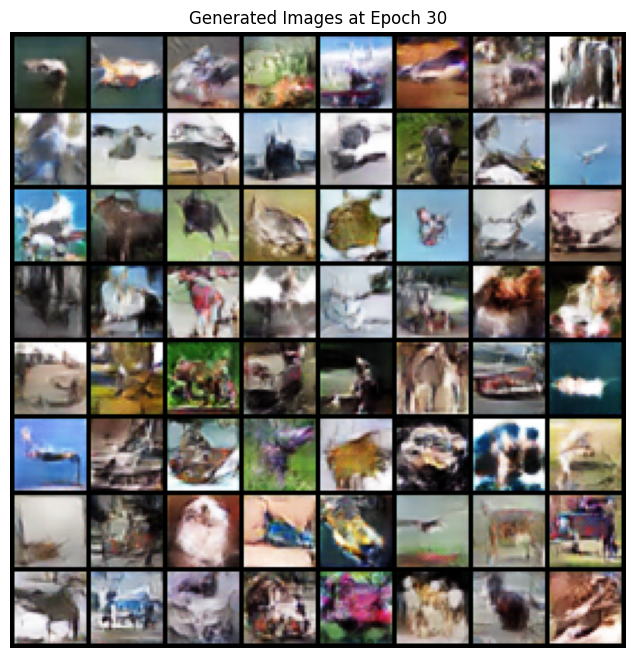

[GAN] Epoch 31/50 | Avg D_loss: 0.8529, Avg G_loss: 2.0653 | D(x): 0.6229 | D(G(z)): 0.2488 / 0.1676
[GAN] Epoch 32/50 | Avg D_loss: 0.8417, Avg G_loss: 2.0864 | D(x): 0.6141 | D(G(z)): 0.2480 / 0.2843
[GAN] Epoch 33/50 | Avg D_loss: 0.8199, Avg G_loss: 2.1221 | D(x): 0.8104 | D(G(z)): 0.2058 / 0.0708
[GAN] Epoch 34/50 | Avg D_loss: 0.8756, Avg G_loss: 2.1599 | D(x): 0.4785 | D(G(z)): 0.0788 / 0.1778
[GAN] Epoch 35/50 | Avg D_loss: 0.8183, Avg G_loss: 2.1380 | D(x): 0.4705 | D(G(z)): 0.0934 / 0.3086


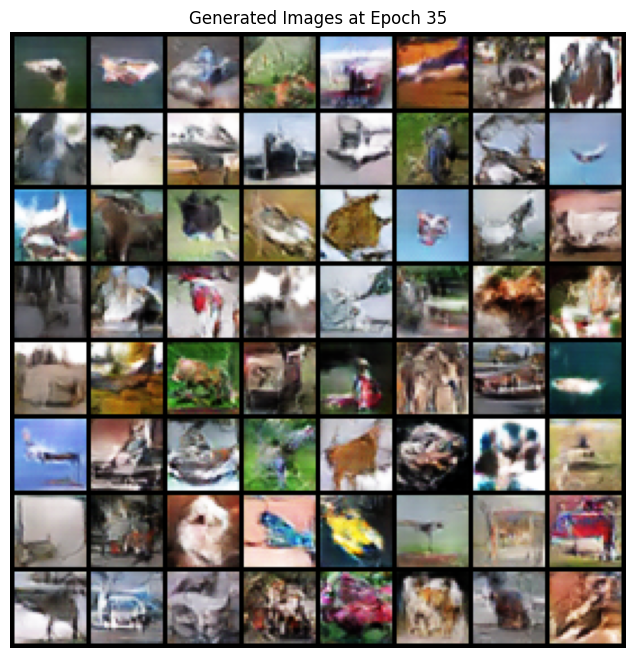

[GAN] Epoch 36/50 | Avg D_loss: 0.7861, Avg G_loss: 2.2136 | D(x): 0.8971 | D(G(z)): 0.5918 / 0.0174
[GAN] Epoch 37/50 | Avg D_loss: 0.9622, Avg G_loss: 2.1960 | D(x): 0.6659 | D(G(z)): 0.5410 / 0.1488
[GAN] Epoch 38/50 | Avg D_loss: 0.7921, Avg G_loss: 2.0899 | D(x): 0.7335 | D(G(z)): 0.2187 / 0.1280
[GAN] Epoch 39/50 | Avg D_loss: 0.7946, Avg G_loss: 2.2017 | D(x): 0.7404 | D(G(z)): 0.1964 / 0.1030
[GAN] Epoch 40/50 | Avg D_loss: 0.8569, Avg G_loss: 2.1955 | D(x): 0.7451 | D(G(z)): 0.2711 / 0.1004


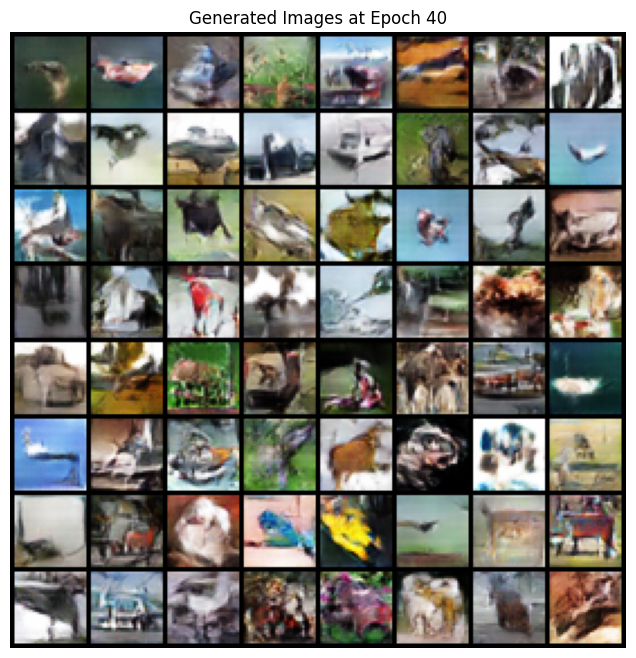

[GAN] Epoch 41/50 | Avg D_loss: 0.7669, Avg G_loss: 2.2259 | D(x): 0.7335 | D(G(z)): 0.3075 / 0.0906
[GAN] Epoch 42/50 | Avg D_loss: 0.7700, Avg G_loss: 2.2696 | D(x): 0.7942 | D(G(z)): 0.3335 / 0.0988
[GAN] Epoch 43/50 | Avg D_loss: 0.8661, Avg G_loss: 2.2497 | D(x): 0.5983 | D(G(z)): 0.1342 / 0.2189
[GAN] Epoch 44/50 | Avg D_loss: 0.7665, Avg G_loss: 2.2590 | D(x): 0.6592 | D(G(z)): 0.1240 / 0.1952
[GAN] Epoch 45/50 | Avg D_loss: 0.7477, Avg G_loss: 2.3355 | D(x): 0.5389 | D(G(z)): 0.0924 / 0.2167


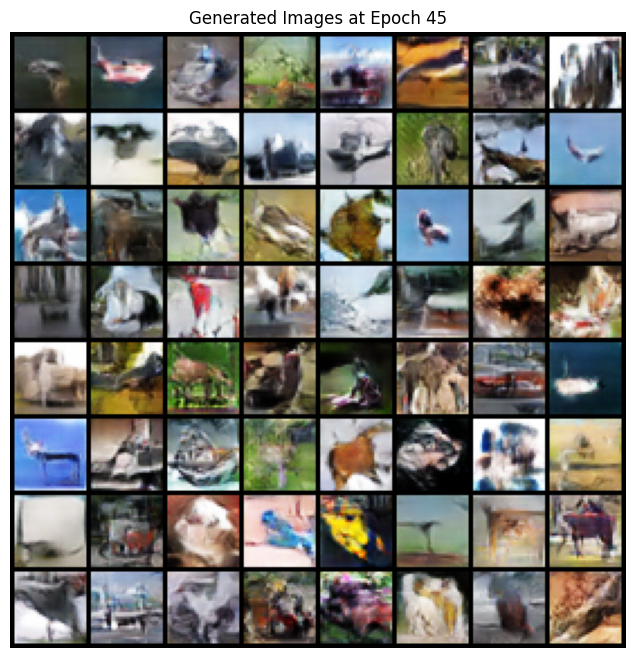

[GAN] Epoch 46/50 | Avg D_loss: 0.7703, Avg G_loss: 2.3987 | D(x): 0.8293 | D(G(z)): 0.2036 / 0.0752
[GAN] Epoch 47/50 | Avg D_loss: 0.7052, Avg G_loss: 2.4028 | D(x): 0.5639 | D(G(z)): 0.0768 / 0.1783
[GAN] Epoch 48/50 | Avg D_loss: 1.1070, Avg G_loss: 2.1062 | D(x): 0.7289 | D(G(z)): 0.3273 / 0.1002
[GAN] Epoch 49/50 | Avg D_loss: 0.7000, Avg G_loss: 2.3439 | D(x): 0.8593 | D(G(z)): 0.2260 / 0.0498
[GAN] Epoch 50/50 | Avg D_loss: 0.7213, Avg G_loss: 2.4266 | D(x): 0.8741 | D(G(z)): 0.2261 / 0.0604


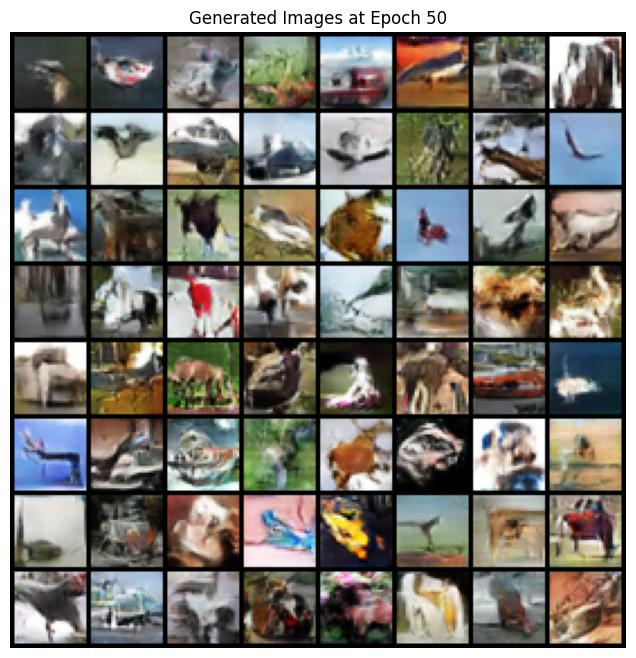

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.utils as vutils
import matplotlib.pyplot as plt

latent_dim = 100
G = Generator(latent_dim).to(device)
D = Discriminator().to(device)


def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

G.apply(weights_init)
D.apply(weights_init)

criterion = nn.BCELoss()
optimizer_G = optim.Adam(G.parameters(), lr=2e-4, betas=(0.5, 0.999))
optimizer_D = optim.Adam(D.parameters(), lr=2e-4, betas=(0.5, 0.999))

num_epochs = 50
fixed_noise = torch.randn(64, latent_dim, 1, 1, device=device)

for epoch in range(num_epochs):
    d_loss_epoch, g_loss_epoch = 0.0, 0.0
    for i, (imgs, _) in enumerate(trainloader):
        imgs = imgs.to(device)
        batch_size = imgs.size(0)

        real = torch.full((batch_size, 1), 0.9, device=device)
        fake = torch.zeros((batch_size, 1), device=device)

        D.zero_grad()

        output_real = D(imgs)
        error_D_real = criterion(output_real, real)
        error_D_real.backward()
        D_x = output_real.mean().item()

        noise = torch.randn(batch_size, latent_dim, 1, 1, device=device)
        fake_imgs = G(noise)
        output_fake = D(fake_imgs.detach())
        error_D_fake = criterion(output_fake, fake)
        error_D_fake.backward()
        D_G_z1 = output_fake.mean().item()

        
        errD = error_D_real + error_D_fake
        optimizer_D.step()

        G.zero_grad()
        label_g = torch.full((batch_size, 1), 1.0, device=device)  
        output_fake_for_G = D(fake_imgs)
        errG = criterion(output_fake_for_G, label_g)
        errG.backward()
        D_G_z2 = output_fake_for_G.mean().item()
        optimizer_G.step()

        
        d_loss_epoch += errD.item()
        g_loss_epoch += errG.item()

    
    d_loss_epoch /= len(trainloader)
    g_loss_epoch /= len(trainloader)

    print(f"[GAN] Epoch {epoch+1}/{num_epochs} | "
          f"Avg D_loss: {d_loss_epoch:.4f}, Avg G_loss: {g_loss_epoch:.4f} | "
          f"D(x): {D_x:.4f} | D(G(z)): {D_G_z1:.4f} / {D_G_z2:.4f}")

    
    if (epoch + 1) % 5 == 0:
        with torch.no_grad():
            fake_samples = G(fixed_noise).cpu()
        grid = vutils.make_grid(fake_samples, nrow=8, normalize=True)
        plt.figure(figsize=(8, 8))
        plt.axis("off")
        plt.title(f"Generated Images at Epoch {epoch+1}")
        plt.imshow(grid.permute(1, 2, 0).numpy())
        plt.show()


In [ ]:
latent_dim = 100
G = Generator(latent_dim).to(device)
D = Discriminator().to(device)

In [ ]:
G_sd = torch.load("./G_epoch50_DC.pth")
D_sd = torch.load( "./D_epoch50_DC.pth")

G.load_state_dict(G_sd)
D.load_state_dict(D_sd)

<All keys matched successfully>

## Reconstruction vs. Generation

In [ ]:
import torch
import torchvision.utils as vutils
import matplotlib.pyplot as plt

def compare_vae_gan(vae, G, testloader, vae_latent_dim, G_latent_dim, device, n_samples=16):

    vae.eval()
    G.eval()

    imgs, _ = next(iter(testloader))
    imgs = imgs[:n_samples].to(device)

    with torch.no_grad():
        recon, mu, log_var = vae(imgs)

    fixed_z = torch.randn(n_samples, latent_dim, 1, 1).to(device)
    with torch.no_grad():
        fake_imgs = G(fixed_z)

    def show_grid(tensor, title):
        grid = vutils.make_grid(tensor.cpu(), nrow=4, normalize=True, scale_each=True)
        plt.figure(figsize=(6,6))
        plt.imshow(grid.permute(1,2,0).numpy())
        plt.axis("off")
        plt.title(title)
        plt.show()

    show_grid(imgs, "Original Test Images")
    show_grid(recon, "VAE Reconstructions")
    show_grid(fake_imgs, "GAN Generations")


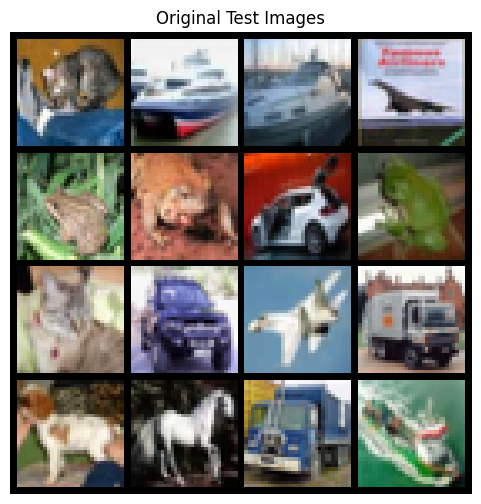

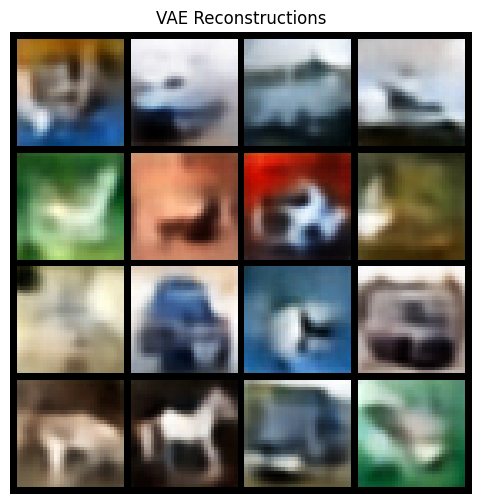

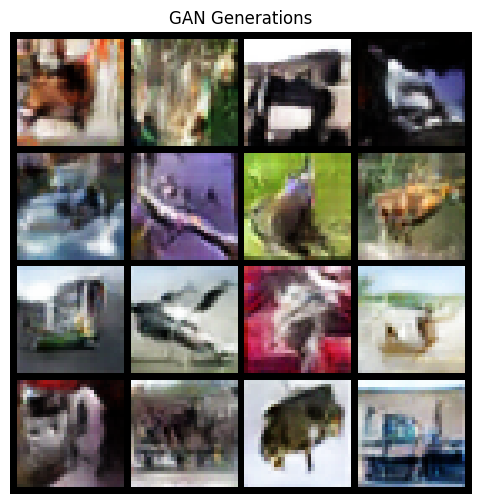

In [ ]:
compare_vae_gan(vae, G, testloader, vae_latent_dim=128, G_latent_dim=100, device=device, n_samples=16)


In [ ]:
import torch
import matplotlib.pyplot as plt

def compare_single_vae_gan(vae, G, testloader, vae_latent_dim, G_latent_dim, device):
    vae.eval()
    G.eval()

    imgs, _ = next(iter(testloader))

    idx = torch.randint(0, imgs.size(0), (1,)).item()
    img = imgs[idx:idx+1].to(device)

    with torch.no_grad():
        recon, mu, log_var = vae(img)

    fixed_z = torch.randn(1, G_latent_dim, 1, 1).to(device)
    with torch.no_grad():
        fake_img = G(fixed_z)

    def show_triplet(original, vae_img, gan_img):
        fig, axes = plt.subplots(1, 3, figsize=(9, 3))
        titles = ["Original", "VAE Reconstruction", "GAN Generation"]

        imgs = [original, vae_img, gan_img]
        for ax, im, title in zip(axes, imgs, titles):
            im = im.cpu().squeeze().permute(1, 2, 0).numpy()
            im = (im - im.min()) / (im.max() - im.min())  
            ax.imshow(im)
            ax.axis("off")
            ax.set_title(title)

        plt.tight_layout()
        plt.show()

    show_triplet(img, recon, fake_img)


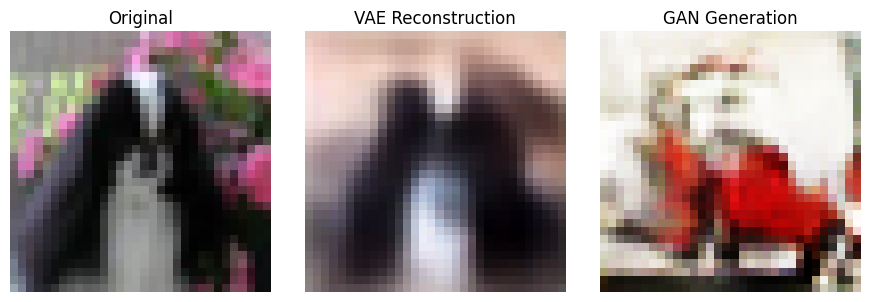

In [ ]:
compare_single_vae_gan(vae, G, testloader, vae_latent_dim=128, G_latent_dim=100, device=device)


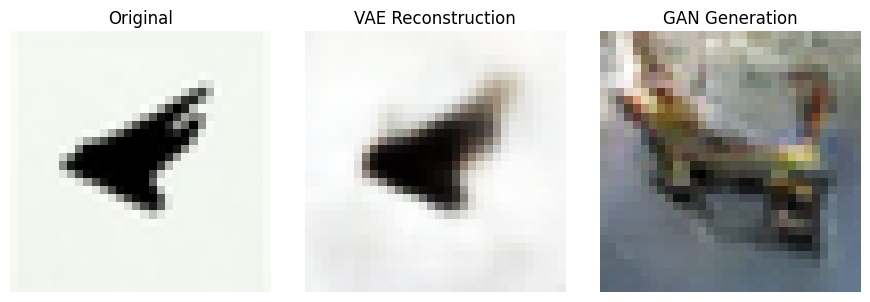

In [ ]:
compare_single_vae_gan(vae, G, testloader, vae_latent_dim=128, G_latent_dim=100, device=device)


## Fidelity Score Computation

In [ ]:
!pip install torch-fidelity

In [ ]:
vae.eval()
num_samples = 1000
latent_dim = 128

with torch.no_grad():
    z = torch.randn(num_samples, latent_dim).to(device)
    vae_samples = vae.decode(z)
    vae_samples = (vae_samples * 0.5 + 0.5).clamp(0, 1)


In [ ]:
G.eval()
num_samples = 1000
latent_dim = 100

with torch.no_grad():
    z = torch.randn(num_samples, latent_dim, 1, 1).to(device)
    gan_samples = G(z).cpu()
    gan_samples = (gan_samples * 0.5 + 0.5).clamp(0, 1)

if gan_samples.shape[1] == 1:
    gan_samples = gan_samples.repeat(1, 3, 1, 1)


In [ ]:
import os
from torchvision.utils import save_image

vae_dir = "./vae_samples"
gan_dir = "./gan_samples"
os.makedirs(vae_dir, exist_ok=True)
os.makedirs(gan_dir, exist_ok=True)


for i in range(vae_samples.size(0)):
    save_image(vae_samples[i], os.path.join(vae_dir, f"{i}.png"))


for i in range(gan_samples.size(0)):
    save_image(gan_samples[i], os.path.join(gan_dir, f"{i}.png"))


In [ ]:
from torch_fidelity import calculate_metrics

metrics_vae = calculate_metrics(
    input1=vae_dir,
    cuda=True,                
    isc=True,                 
    fid=False,
    kid=False
)

metrics_gan = calculate_metrics(
    input1=gan_dir,
    cuda=True,
    isc=True,
    fid=False,
    kid=False
)

print("VAE Inception Score:", metrics_vae['inception_score_mean'])
print("GAN Inception Score:", metrics_gan['inception_score_mean'])


Creating feature extractor "inception-v3-compat" with features ['logits_unbiased']
Downloading: "https://github.com/toshas/torch-fidelity/releases/download/v0.2.0/weights-inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/weights-inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:01<00:00, 79.6MB/s]
Extracting features from input1
Looking for samples non-recursivelty in "./vae_samples" with extensions png,jpg,jpeg
Found 1000 samples
/usr/local/lib/python3.12/dist-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627:

VAE Inception Score: 3.2480503284602484
GAN Inception Score: 5.531891866124297


Processing samples
Inception Score: 5.531891866124297 ± 0.5512062276852291


In [ ]:
print("VAE Inception Score:", metrics_vae['inception_score_mean'])
print("GAN Inception Score:", metrics_gan['inception_score_mean'])

VAE Inception Score: 3.2480503284602484
GAN Inception Score: 5.531891866124297


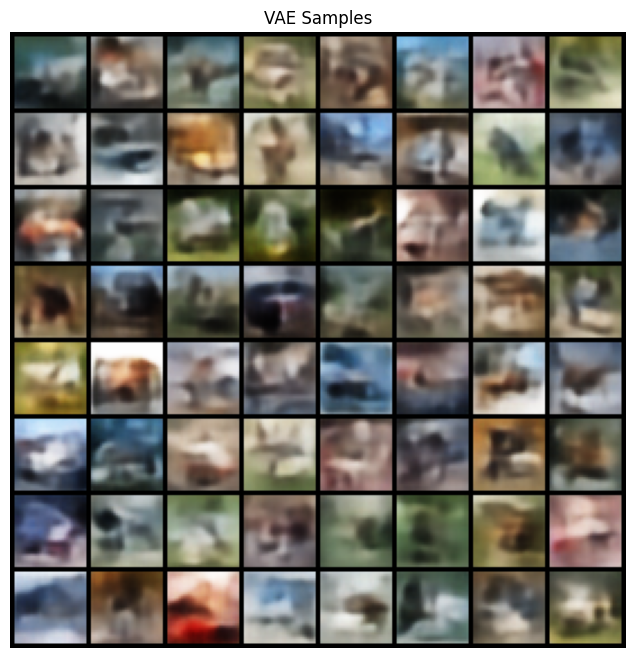

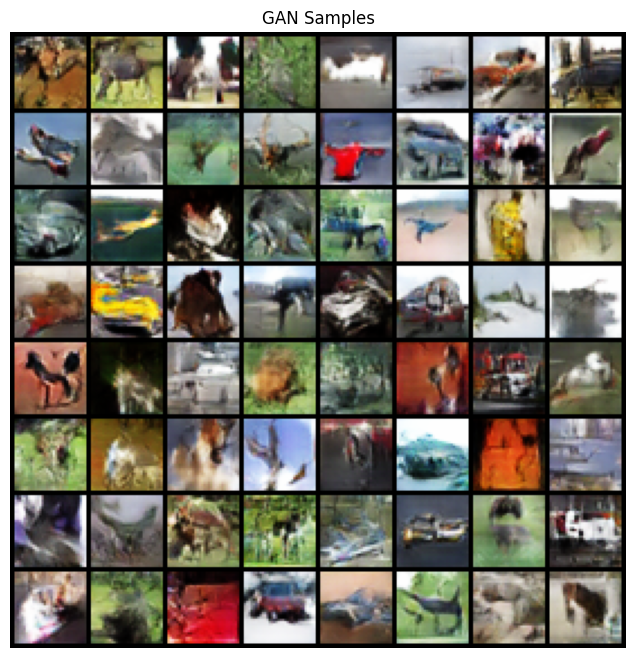

In [ ]:
def show_grid(samples, title):
    grid = vutils.make_grid(samples, nrow=8)
    plt.figure(figsize=(8,8))
    plt.imshow(grid.permute(1,2,0).cpu().numpy())
    plt.axis('off')
    plt.title(title)
    plt.show()

show_grid(vae_samples[:64], "VAE Samples")
show_grid(gan_samples[:64], "GAN Samples")

In [ ]:
real_dir = "./real_samples"
os.makedirs(real_dir, exist_ok=True)

num_samples = 1000
count = 0
for imgs, _ in testloader:
    for i in range(imgs.size(0)):
        if count >= num_samples:
            break
        save_image((imgs[i]*0.5+0.5).clamp(0,1), os.path.join(real_dir, f"{count}.png"))
        count += 1
    if count >= num_samples:
        break

print(f"Saved {count} real images to {real_dir}")




fid_vae = calculate_metrics(input1=vae_dir, input2=real_dir, cuda=True, isc=False, fid=True)
fid_gan = calculate_metrics(input1=gan_dir, input2=real_dir, cuda=True, isc=False, fid=True)

print("VAE FID:", fid_vae['frechet_inception_distance'])
print("GAN FID:", fid_gan['frechet_inception_distance'])

Saved 1000 real images to ./real_samples


Creating feature extractor "inception-v3-compat" with features ['2048']
Extracting statistics from input 1
Looking for samples non-recursivelty in "./vae_samples" with extensions png,jpg,jpeg
Found 1000 samples
Processing samples
Extracting statistics from input 2
Looking for samples non-recursivelty in "./real_samples" with extensions png,jpg,jpeg
Found 1000 samples
Processing samples
Frechet Inception Distance: 164.3223387548466
Creating feature extractor "inception-v3-compat" with features ['2048']
Extracting statistics from input 1
Looking for samples non-recursivelty in "./gan_samples" with extensions png,jpg,jpeg
Found 1000 samples
Processing samples
Extracting statistics from input 2
Looking for samples non-recursivelty in "./real_samples" with extensions png,jpg,jpeg
Found 1000 samples
Processing samples


VAE FID: 164.3223387548466
GAN FID: 86.97860998579495


Frechet Inception Distance: 86.97860998579495


## Latent Interpolation

In [ ]:
import torch
import torchvision.utils as vutils
import matplotlib.pyplot as plt
import numpy as np

def latent_interpolation(vae, G, testloader, latent_dim, device, n_steps=10):
    """
    Compare latent space interpolations of VAE and GAN.

    Args:
        vae: trained VAE model
        G: trained GAN generator
        testloader: DataLoader for CIFAR-10 test set
        latent_dim: GAN latent dimension
        device: 'cuda' or 'cpu'
        n_steps: number of interpolation steps
    """
    vae.eval()
    G.eval()

    
    
    dataset = testloader.dataset
    indices = torch.randperm(len(dataset))[:2]  
    x1, _ = dataset[indices[0]]
    x2, _ = dataset[indices[1]]
    x1, x2 = x1.unsqueeze(0).to(device), x2.unsqueeze(0).to(device)


    with torch.no_grad():
        _, mu1, log_var1 = vae(x1)
        _, mu2, log_var2 = vae(x2)

    z1, z2 = mu1, mu2
    alphas = np.linspace(0, 1, n_steps)

    interpolations_vae = []
    with torch.no_grad():
        for alpha in alphas:
            z = (1 - alpha) * z1 + alpha * z2
            recon = vae.decode(z)  
            interpolations_vae.append(recon.squeeze(0))
    interpolations_vae = torch.stack(interpolations_vae)

    
    z1 = torch.randn(1, latent_dim, 1, 1).to(device)
    z2 = torch.randn(1, latent_dim, 1, 1).to(device)

    interpolations_gan = []
    with torch.no_grad():
        for alpha in alphas:
            z = (1 - alpha) * z1 + alpha * z2
            fake = G(z)
            interpolations_gan.append(fake.squeeze(0))
    interpolations_gan = torch.stack(interpolations_gan)

    
    def show_interpolations(tensor, title):
        grid = vutils.make_grid(tensor.cpu(), nrow=n_steps, normalize=True, scale_each=True)
        plt.figure(figsize=(2*n_steps, 2))
        plt.imshow(grid.permute(1,2,0).numpy())
        plt.axis("off")
        plt.title(title)
        plt.show()

    show_interpolations(interpolations_vae, "VAE Latent Interpolation")
    show_interpolations(interpolations_gan, "GAN Latent Interpolation")


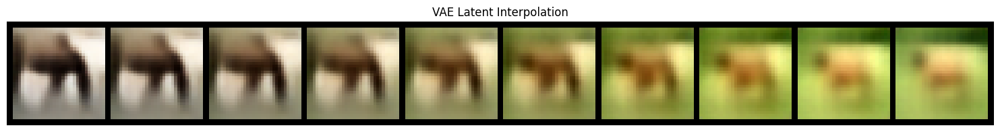

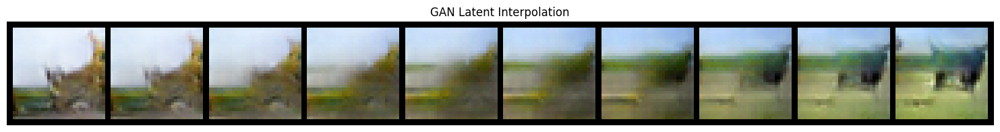

In [ ]:
latent_interpolation(vae, G, testloader, latent_dim=100, device=device, n_steps=5)

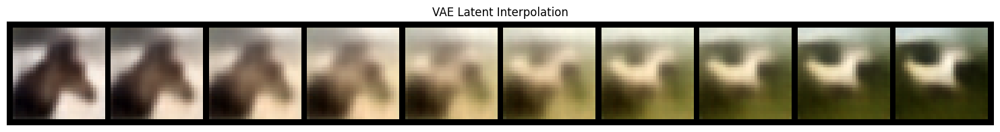

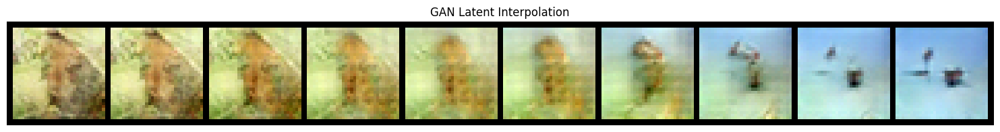

In [ ]:
latent_interpolation(vae, G, testloader, latent_dim=100, device=device, n_steps=10)

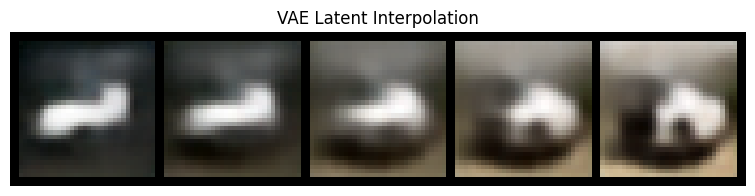

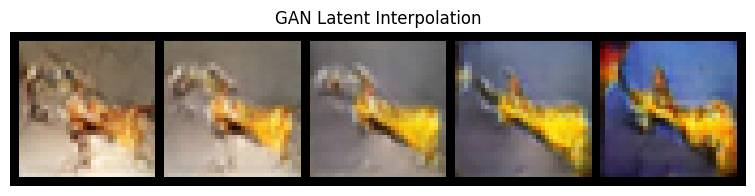

In [ ]:
latent_interpolation(vae, G, testloader, latent_dim=100, device=device, n_steps=5)

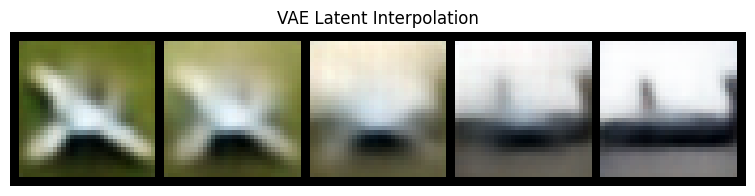

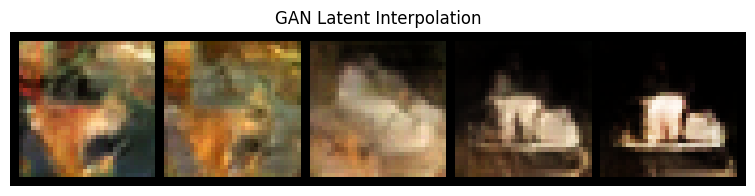

In [ ]:
latent_interpolation(vae, G, testloader, latent_dim=100, device=device, n_steps=5)

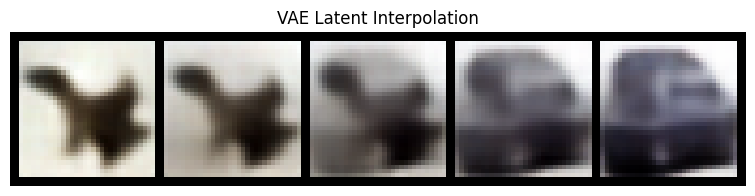

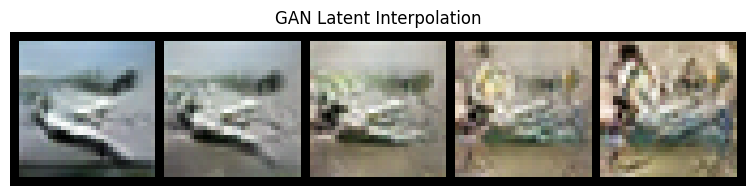

In [ ]:
latent_interpolation(vae, G, testloader, latent_dim=100, device=device, n_steps=5)

## Latent Space Visualization for VAEs

In [ ]:
import torch
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

CIFAR10_CLASSES = [
    "airplane", "automobile", "bird", "cat", "deer",
    "dog", "frog", "horse", "ship", "truck"
]


import torch
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE


CIFAR10_CLASSES = [
    "airplane", "automobile", "bird", "cat", "deer",
    "dog", "frog", "horse", "ship", "truck"
]

def visualize_latent_space(vae, testloader, device, latent_dim, method="tsne", n_samples=2000):
    """
    Visualize VAE latent representations using PCA or t-SNE.

    Args:
        vae: trained VAE with encoder
        testloader: DataLoader for test set
        device: 'cuda' or 'cpu'
        latent_dim: dimension of VAE latent space
        method: "pca" or "tsne"
        n_samples: number of samples to visualize
    """
    vae.eval()
    zs, ys = [], []

    with torch.no_grad():
        for imgs, labels in testloader:
            imgs = imgs.to(device)
            _, mu, _ = vae(imgs)   
            zs.append(mu.cpu())
            ys.append(labels)
            if len(torch.cat(zs)) > n_samples:
                break

    zs = torch.cat(zs)[:n_samples].numpy()
    ys = torch.cat(ys)[:n_samples].numpy()

    
    if method.lower() == "pca":
        reducer = PCA(n_components=2)
    else:
        reducer = TSNE(n_components=2, perplexity=30, n_iter=1000, learning_rate="auto")

    zs_2d = reducer.fit_transform(zs)

    
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(zs_2d[:, 0], zs_2d[:, 1], c=ys, cmap="tab10", alpha=0.6, s=15)

    
    handles, _ = scatter.legend_elements()
    plt.legend(handles, CIFAR10_CLASSES, title="Classes", bbox_to_anchor=(1.05, 1), loc="upper left")

    plt.title(f"VAE Latent Space ({method.upper()})")
    plt.show()


/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


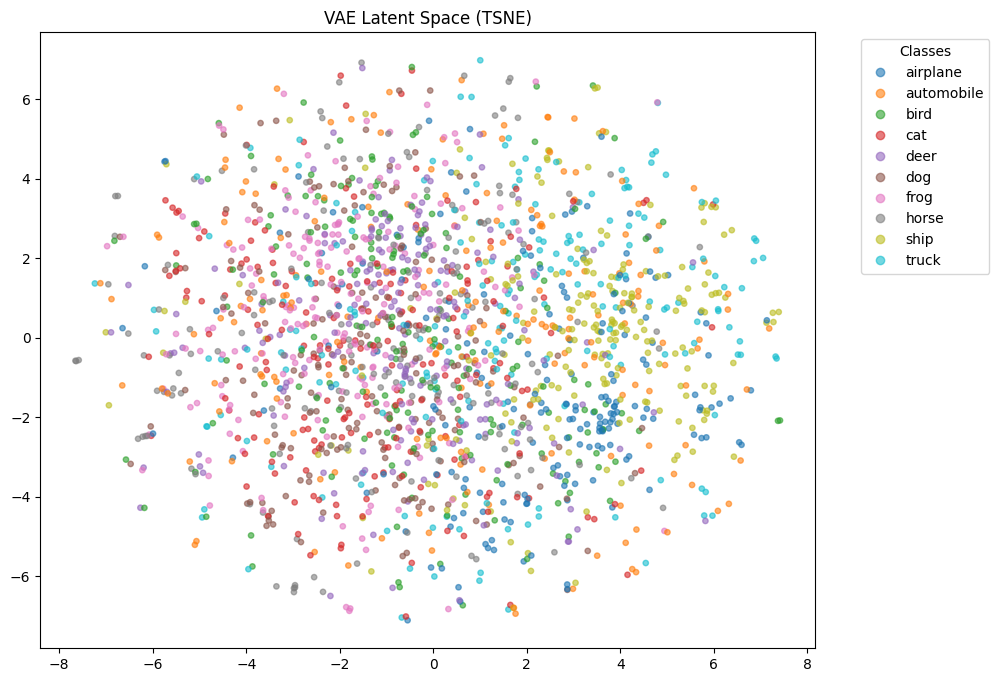

In [ ]:
visualize_latent_space(vae, testloader, device, latent_dim=128, method='TSNE')

## Semantic Factor Investigation


In [ ]:
import torch
import matplotlib.pyplot as plt

def latent_traversal(vae, device, latent_dim=128, steps=10, traverse_range=(-3, 3)):
    vae.eval()

    
    base_z = torch.randn(1, latent_dim).to(device)

    
    dims_to_test = list(range(min(10, latent_dim)))  

    fig, axes = plt.subplots(len(dims_to_test), steps, figsize=(steps * 2, len(dims_to_test) * 2))
    if len(dims_to_test) == 1:  
        axes = [axes]

    traversal_values = torch.linspace(traverse_range[0], traverse_range[1], steps).to(device)

    for row, dim in enumerate(dims_to_test):
        for col, val in enumerate(traversal_values):
            z = base_z.clone()
            z[0, dim] = val  
            with torch.no_grad():
                img = vae.decode(z).cpu().squeeze(0).permute(1, 2, 0)
            img = (img + 1) / 2  
            axes[row][col].imshow(img.numpy())
            axes[row][col].axis("off")

        
        axes[row][0].set_ylabel(f"z[{dim}]", fontsize=12, rotation=0, labelpad=30, va="center")

    
    for col, val in enumerate(traversal_values):
        axes[0][col].set_title(f"{val.item():.1f}", fontsize=10)

    
    fig.text(0.5, 0.02, f"Latent dimension value → increasing (from {traverse_range[0]} to {traverse_range[1]})",
             ha="center", fontsize=12)

    
    fig.text(0.02, 0.5, "Traversed dimensions", va="center", rotation="vertical", fontsize=12)

    plt.tight_layout(rect=[0.05, 0.05, 1, 1])
    plt.show()


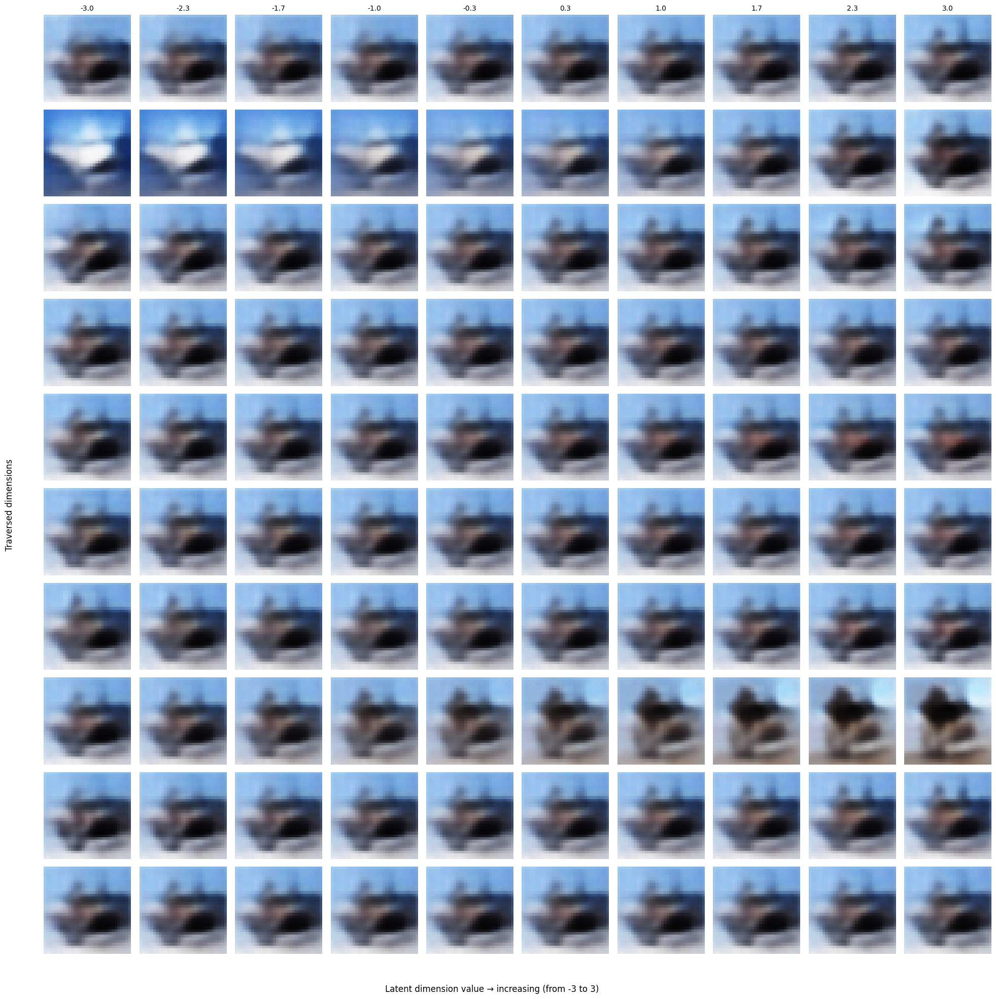

In [ ]:
latent_traversal(vae, device)

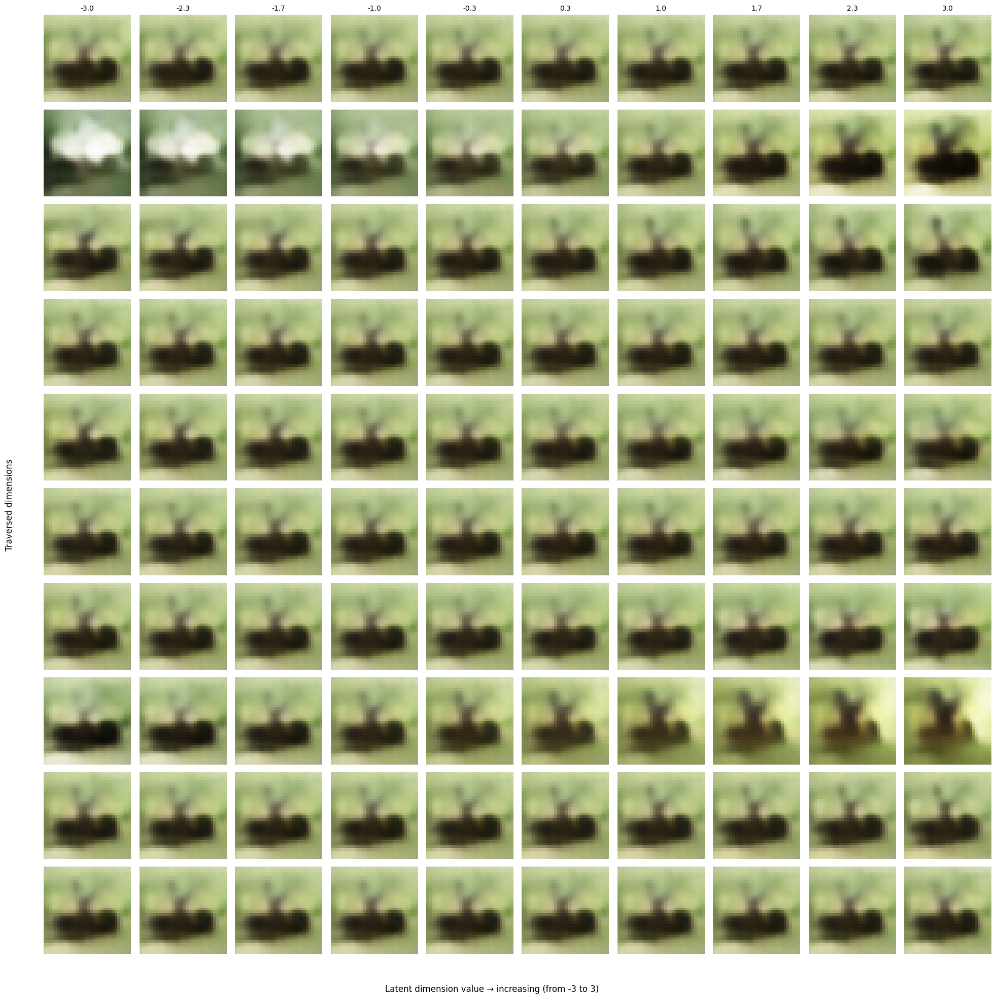

In [ ]:
latent_traversal(vae, device)

## OOD Test for VAEs

In [ ]:
import torch
import torch.nn.functional as F

def evaluate_vae_ood(vae, in_loader, ood_loader, device):
    vae.eval()

    def recon_error(loader):
        errs = []
        with torch.no_grad():
            for imgs, _ in loader:
                imgs = imgs.to(device)
                recons, _, _ = vae(imgs)
                loss = F.mse_loss(recons, imgs, reduction="none")
                loss = loss.view(loss.size(0), -1).mean(dim=1)  
                errs.append(loss.cpu())
        return torch.cat(errs)

    in_errors = recon_error(in_loader)
    ood_errors = recon_error(ood_loader)

    print(f"Mean IN-dist recon error (CIFAR-10): {in_errors.mean().item():.4f}")
    print(f"Mean OOD recon error (CIFAR-100): {ood_errors.mean().item():.4f}")

    return in_errors, ood_errors


In [ ]:
ood_set = torchvision.datasets.CIFAR100(root='./data', train=True,
                                        download=True, transform=transform)
ood_loader = torch.utils.data.DataLoader(ood_set, batch_size=batch_size,
                                          shuffle=True, num_workers=2)

100%|██████████| 169M/169M [00:17<00:00, 9.88MB/s]


In [ ]:
avg_in_error, avg_out_error = evaluate_vae_ood(vae, trainloader, ood_loader, device)

Mean IN-dist recon error (CIFAR-10): 0.0368
Mean OOD recon error (CIFAR-100): 0.0382


### Feature Distribution Analysis between CIFAR-10 and CIFAR-100

In [ ]:
import torch
import torch.nn as nn
import torchvision.models as models


resnet = models.resnet18(pretrained=True)
feature_extractor = nn.Sequential(*list(resnet.children())[:-1])  
feature_extractor.eval().to(device)

def get_features(loader, model, device, max_samples=1000):
    feats = []
    seen = 0
    with torch.no_grad():
        for imgs, _ in loader:
            imgs = imgs.to(device)
            f = model(imgs).squeeze()  
            feats.append(f.cpu())
            seen += imgs.size(0)
            if seen >= max_samples:
                break
    feats = torch.cat(feats, dim=0)
    return feats[:max_samples]  





/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
c10_feats = get_features(trainloader, feature_extractor, device)
c100_feats = get_features(ood_loader, feature_extractor, device)

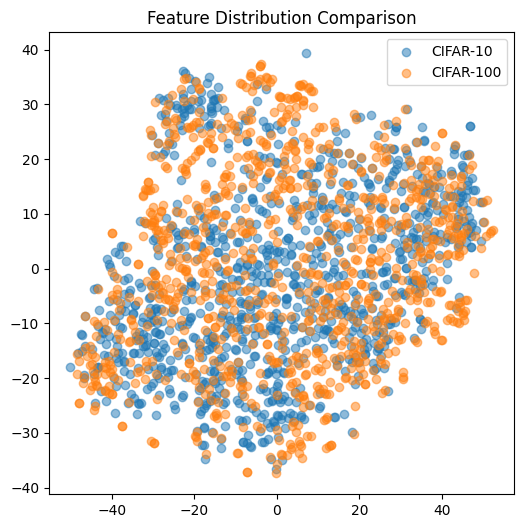

In [ ]:
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt


all_feats = torch.cat([c10_feats, c100_feats], dim=0).numpy()
labels = np.array([0]*len(c10_feats) + [1]*len(c100_feats))  


tsne = TSNE(n_components=2, perplexity=30, random_state=42)
feats_2d = tsne.fit_transform(all_feats)


plt.figure(figsize=(6,6))
plt.scatter(feats_2d[labels==0,0], feats_2d[labels==0,1], alpha=0.5, label="CIFAR-10")
plt.scatter(feats_2d[labels==1,0], feats_2d[labels==1,1], alpha=0.5, label="CIFAR-100")
plt.legend()
plt.title("Feature Distribution Comparison")
plt.show()


## OOD Test for GANs

In [ ]:
import torchvision.utils as vutils
import matplotlib.pyplot as plt

def stress_test_gan(G, latent_dim, device, n_samples=16):
    G.eval()
    with torch.no_grad():
        
        z_in = torch.randn(n_samples, latent_dim, 1, 1).to(device)
        imgs_in = G(z_in)

        
        z_ood = 10 * torch.randn(n_samples, latent_dim, 1, 1).to(device)
        imgs_ood = G(z_ood)

    def show(imgs, title):
        grid = vutils.make_grid(imgs.cpu(), nrow=4, normalize=True, scale_each=True)
        plt.figure(figsize=(6,6))
        plt.imshow(grid.permute(1,2,0).numpy())
        plt.axis("off")
        plt.title(title)
        plt.show()

    show(imgs_in, "GAN In-Distribution Samples (z ~ N(0,1))")
    show(imgs_ood, "GAN OOD Samples (z ~ N(0,10))")


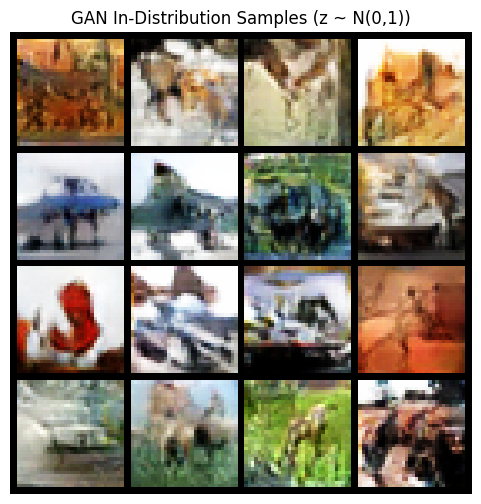

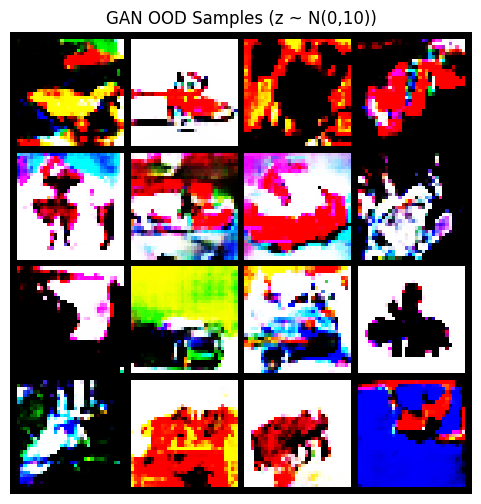

In [ ]:
stress_test_gan(G, latent_dim=100, device=device)

In [ ]:
import torch
import matplotlib.pyplot as plt

def stress_test_gan_single(G, latent_dim, device):
    G.eval()
    with torch.no_grad():
        z_in = torch.randn(1, latent_dim, 1, 1).to(device)
        img_in = G(z_in)

        z_ood = 10 * torch.randn(1, latent_dim, 1, 1).to(device)
        img_ood = G(z_ood)

    fig, axes = plt.subplots(1, 2, figsize=(6, 3))
    titles = ["GAN In-Distribution (z ~ N(0,1))", "GAN OOD (z ~ N(0,10))"]
    imgs = [img_in, img_ood]

    for ax, im, title in zip(axes, imgs, titles):
        im = im.cpu().squeeze().permute(1, 2, 0).numpy()
        im = (im - im.min()) / (im.max() - im.min())  
        ax.imshow(im)
        ax.axis("off")
        ax.set_title(title)

    plt.tight_layout()
    plt.show()


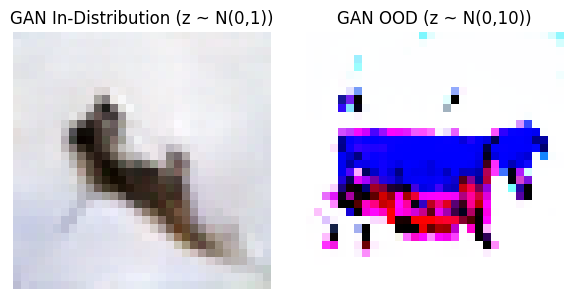

In [ ]:
stress_test_gan_single(G, latent_dim, device)